# **STEP 1: 작업환경 구성하기**

In [1]:
# 필요한 라이브러리 설치
!pip install imageio Pillow tensorflow

# Google Colab 환경에 맞게 디렉토리 생성
import os

os.makedirs('/content/dcgan_newimage/fashion/generated_samples', exist_ok=True)
os.makedirs('/content/dcgan_newimage/fashion/training_checkpoints', exist_ok=True)
os.makedirs('/content/dcgan_newimage/fashion/training_history', exist_ok=True)

# 라이브러리 임포트
import glob
import time
import numpy as np
import tensorflow as tf
from tensorflow.keras import layers
from IPython import display
import matplotlib.pyplot as plt
from PIL import Image  # Pillow 라이브러리

%matplotlib inline

# TensorFlow 버전 확인
print("TensorFlow version:", tf.__version__)


TensorFlow version: 2.18.0


# **STEP 2: 데이터셋 구성 및 전처리**

170498071/170498071 ━━━━━━━━━━━━━━━━━━━━ 4s 0us/step
Train data shape: (50000, 32, 32, 3)
Max pixel value before normalization: 255
Min pixel value before normalization: 0
Max pixel value after normalization: 1.0
Min pixel value after normalization: -1.0


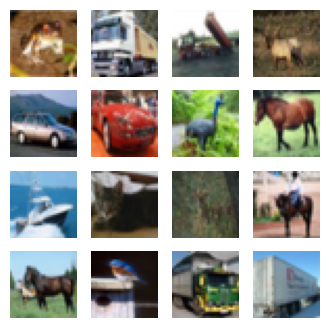

Dataset prepared with batch size 128.


In [2]:
# 데이터셋 로드 (CIFAR-10)
cifar10 = tf.keras.datasets.cifar10
(train_x, _), (test_x, _) = cifar10.load_data()

# 데이터셋 정보 출력
print("Train data shape:", train_x.shape)
print("Max pixel value before normalization:", train_x.max())
print("Min pixel value before normalization:", train_x.min())

# 픽셀 값 정규화 (-1 ~ 1 범위로 변환)
train_x = (train_x / 127.5) - 1

# 정규화 후 데이터 확인
print("Max pixel value after normalization:", train_x.max())
print("Min pixel value after normalization:", train_x.min())

# 데이터셋 형태 변환 (채널 유지)
train_x = train_x.astype('float32')

# 샘플 이미지 출력
plt.figure(figsize=(4, 4))
for i in range(16):
    plt.subplot(4, 4, i + 1)
    plt.imshow((train_x[i] + 1) / 2)  # 다시 [0, 1] 범위로 변환하여 출력
    plt.axis('off')
plt.show()

# Mini-batch 데이터셋 구성
BATCH_SIZE = 128
BUFFER_SIZE = 60000

train_dataset = tf.data.Dataset.from_tensor_slices(train_x).shuffle(BUFFER_SIZE).batch(BATCH_SIZE)

print(f"Dataset prepared with batch size {BATCH_SIZE}.")


데이터 로드: CIFAR-10 데이터셋에서 이미지를 로드합니다.

 레이블은 사용하지 않으므로 _로 처리합니다.


정규화: GAN 학습을 위해 픽셀 값을
[
−
1
,
1
]
[−1,1] 범위로 정규화합니다.

데이터셋 변환: 이미지를 float32 형식으로 변환합니다.

시각화: 샘플 이미지를 시각적으로 확인합니다.

Mini-batch 구성: tf.data.Dataset 모듈의 from_tensor_slices()를 사용하여 셔플 및 배치 처리를 합니다.

# **STEP 3: 생성자 모델 구현하기**

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


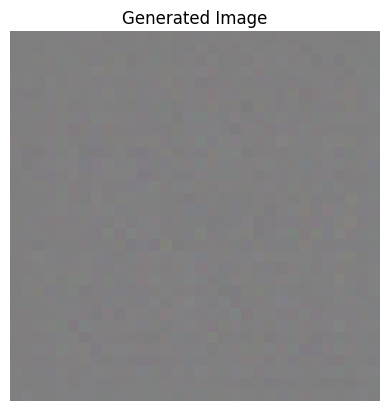

Generated image shape: (1, 32, 32, 3)


In [3]:
# 생성자 모델 정의 함수
def build_generator():
    model = tf.keras.Sequential([
        # 입력: 랜덤 노이즈 벡터 (100차원)
        layers.Dense(8 * 8 * 256, use_bias=False, input_shape=(100,)),
        layers.BatchNormalization(),
        layers.LeakyReLU(),

        # 첫 번째 업샘플링 (8x8x256 -> 16x16x128)
        layers.Reshape((8, 8, 256)),
        layers.Conv2DTranspose(128, (5, 5), strides=(2, 2), padding='same', use_bias=False),
        layers.BatchNormalization(),
        layers.LeakyReLU(),

        # 두 번째 업샘플링 (16x16x128 -> 32x32x64)
        layers.Conv2DTranspose(64, (5, 5), strides=(2, 2), padding='same', use_bias=False),
        layers.BatchNormalization(),
        layers.LeakyReLU(),

        # 출력 레이어 (32x32x64 -> 32x32x3)
        layers.Conv2DTranspose(3, (5, 5), strides=(1, 1), padding='same', activation='tanh')
    ])
    return model

# 생성자 모델 생성
generator = build_generator()

# 랜덤 노이즈 생성
noise = tf.random.normal([1, 100])

# 랜덤 노이즈를 입력으로 하여 이미지 생성
generated_image = generator(noise)

# 생성된 이미지 시각화
plt.imshow((generated_image[0] + 1) / 2)  # [-1, 1] 범위를 [0, 1]로 변환
plt.axis('off')
plt.title("Generated Image")
plt.show()

# 생성자 출력 규격 확인
print("Generated image shape:", generated_image.shape)


생성자 모델 구조:
입력: 랜덤 노이즈 벡터 (
100
100-차원).

업샘플링: Dense와 Conv2DTranspose 레이어를 사용하여 점진적으로 이미지를 확대.
출력:
32
×
32
×
3
32×32×3 크기의 이미지.

활성화 함수: tanh를 사용하여 출력 값을
[
−
1
,
1
]
[−1,1] 범위로 제한.

랜덤 노이즈 생성 및 테스트:
랜덤 노이즈를 생성자로 전달하여 샘플 이미지를 출력합니다.
출력 이미지의 규격(
32
×
32
×
3
32×32×3)을 확인합니다.

# **STEP 4: 판별자 모델 구현하기**

In [4]:
# 판별자 모델 정의 함수
def build_discriminator():
    model = tf.keras.Sequential([
        # 입력: 32x32x3 이미지
        layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same', input_shape=(32, 32, 3)),
        layers.LeakyReLU(),
        layers.Dropout(0.3),

        # 두 번째 컨볼루션 레이어
        layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same'),
        layers.LeakyReLU(),
        layers.Dropout(0.3),

        # 출력 레이어
        layers.Flatten(),
        layers.Dense(1)
    ])
    return model

# 판별자 모델 생성
discriminator = build_discriminator()

# 랜덤 이미지 테스트
random_image = tf.random.normal([1, 32, 32, 3])  # 랜덤 이미지 생성 (32x32x3)
decision = discriminator(random_image)           # 판별 결과

# 판별자 모델 구조 확인 및 출력
discriminator.summary()
print("Discriminator output for random image:", decision.numpy())


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 16, 16, 64)          │           4,864 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_3 (LeakyReLU)            │ (None, 16, 16, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 16, 16, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 8, 8, 128)           │         204,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_4 (LeakyReLU)            │ (None, 8, 8, 128)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 8, 8, 128)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 8192)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 1)                   │           8,193 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 217,985 (851.50 KB)

 Trainable params: 217,985 (851.50 KB)

 Non-trainable params: 0 (0.00 B)

Discriminator output for random image: [[0.14394477]]


판별자 모델 구조:
입력:
32
×
32
×
3
32×32×3 크기의 이미지.

Conv2D와 LeakyReLU를 사용하여 특징을 추출하고 Dropout으로 과적합 방지.
마지막에 Dense(1)로 출력값을 생성하여 입력 이미지가 실제인지 가짜인지 판별.

랜덤 이미지 테스트:
랜덤 이미지를 생성하여 판별자에 전달.
출력값은 이미지가 실제(real)일 확률에 대한 스칼라 값.

# **STEP 5: 손실 함수 및 최적화 함수 구현하기**

In [5]:
# 손실 함수 정의
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

# 판별자 손실 함수
def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)  # 실제 이미지에 대한 손실
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)  # 생성된 이미지에 대한 손실
    total_loss = real_loss + fake_loss
    return total_loss

# 생성자 손실 함수
def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)  # 생성된 이미지를 실제로 판별하도록 학습

# 정확도 계산 함수 (판별자 출력값으로 실제/가짜 이미지 판별 정확도 계산)
def discriminator_accuracy(real_output, fake_output):
    real_accuracy = tf.reduce_mean(tf.cast(tf.equal(tf.ones_like(real_output), tf.round(tf.sigmoid(real_output))), tf.float32))
    fake_accuracy = tf.reduce_mean(tf.cast(tf.equal(tf.zeros_like(fake_output), tf.round(tf.sigmoid(fake_output))), tf.float32))
    return real_accuracy, fake_accuracy

# 옵티마이저 정의
generator_optimizer = tf.keras.optimizers.Adam(1e-4)
discriminator_optimizer = tf.keras.optimizers.Adam(1e-4)

print("Loss functions and optimizers are defined.")


Loss functions and optimizers are defined.


손실 함수:
BinaryCrossentropy를 사용하여 생성자와 판별자의 손실을 계산.  

판별자는 실제 이미지를 1, 가짜 이미지를 0으로 분류하도록 학습.

생성자는 가짜 이미지를 1로 분류하도록 학습.


정확도 계산:
판별자가 실제(real)와 가짜(fake) 이미지를 얼마나 정확히 분류했는지 평가.

옵티마이저:
Adam 옵티마이저를 사용하여 생성자와 판별자를 각각 최적화.

# **STEP 6: 훈련 과정 상세 기능 구현하기**

6.1: train_step 함수 구현

In [6]:
@tf.function
def train_step(images):
    # 랜덤 노이즈 생성
    noise = tf.random.normal([BATCH_SIZE, 100])

    # GradientTape를 사용하여 생성자와 판별자의 그래디언트 계산
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        # 생성자 모델을 통해 가짜 이미지 생성
        generated_images = generator(noise, training=True)

        # 판별자 모델이 실제 이미지와 가짜 이미지를 판별
        real_output = discriminator(images, training=True)
        fake_output = discriminator(generated_images, training=True)

        # 손실 함수 계산
        gen_loss = generator_loss(fake_output)
        disc_loss = discriminator_loss(real_output, fake_output)

    # 그래디언트 계산
    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    # 옵티마이저를 사용하여 모델 업데이트
    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

    # 판별자의 정확도 계산
    real_accuracy, fake_accuracy = discriminator_accuracy(real_output, fake_output)

    return gen_loss, disc_loss, real_accuracy, fake_accuracy


6.2: generate_and_save_images 함수 구현

In [7]:
def generate_and_save_images(model, epoch, test_input):
    # 생성자 모델을 통해 이미지를 생성 (훈련 모드 비활성화)
    predictions = model(test_input, training=False)

    # 생성된 이미지 시각화 및 저장
    plt.figure(figsize=(4, 4))
    for i in range(predictions.shape[0]):
        plt.subplot(4, 4, i + 1)
        plt.imshow((predictions[i] + 1) / 2)  # [-1, 1] 범위를 [0, 1]로 변환
        plt.axis('off')

    # 이미지 저장
    plt.savefig(f'/content/dcgan_newimage/fashion/generated_samples/image_at_epoch_{epoch:04d}.png')
    plt.show()


6.3: 학습 히스토리 시각화 함수 구현

In [8]:
def draw_train_history(history):
    epochs = range(len(history['gen_loss']))

    plt.figure(figsize=(12, 6))

    # Loss 그래프
    plt.subplot(1, 2, 1)
    plt.plot(epochs, history['gen_loss'], label='Generator Loss')
    plt.plot(epochs, history['disc_loss'], label='Discriminator Loss')
    plt.title('Loss Over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    # Accuracy 그래프
    plt.subplot(1, 2, 2)
    plt.plot(epochs, history['real_acc'], label='Real Accuracy')
    plt.plot(epochs, history['fake_acc'], label='Fake Accuracy')
    plt.title('Discriminator Accuracy Over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    plt.tight_layout()
    plt.show()


6.4: 체크포인트 설정

In [9]:
# 체크포인트 디렉토리와 체크포인트 객체 정의
checkpoint_dir = '/content/dcgan_newimage/fashion/training_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator=generator,
                                 discriminator=discriminator,
                                 generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer)


train_step: 한 번의 미니배치 훈련 과정을 처리하는 함수로 손실과 정확도를 반환합니다.

generate_and_save_images: 고정된 입력 노이즈를 사용하여 샘플 이미지를 생성하고 저장합니다.

draw_train_history: 학습 과정에서의 손실 및 정확도 변화를 시각화합니다.

체크포인트 설정: 훈련 중간에 모델을 저장하고 재개할 수 있도록 설정합니다.

STEP 7: 학습 과정 진행하기

In [11]:
# 학습에 필요한 설정
EPOCHS = 50
num_examples_to_generate = 16

# 고정된 seed 생성 (훈련 과정 동안 일관된 입력으로 사용)
seed = tf.random.normal([num_examples_to_generate, 100])

# 학습 히스토리 초기화
history = {
    'gen_loss': [],
    'disc_loss': [],
    'real_acc': [],
    'fake_acc': []
}

# 학습 루프 구현
def train(dataset, epochs):
    for epoch in range(epochs):
        start = time.time()

        # 배치 단위로 훈련 진행
        for image_batch in dataset:
            gen_loss, disc_loss, real_acc, fake_acc = train_step(image_batch)

        # 손실 및 정확도 기록
        history['gen_loss'].append(gen_loss.numpy())
        history['disc_loss'].append(disc_loss.numpy())
        history['real_acc'].append(real_acc.numpy())
        history['fake_acc'].append(fake_acc.numpy())

        # 샘플 이미지 생성 및 저장
        generate_and_save_images(generator, epoch + 1, seed)

        # 체크포인트 저장 (10 epoch마다)
        if (epoch + 1) % 10 == 0:
            checkpoint.save(file_prefix=checkpoint_prefix)

        print(f'Epoch {epoch + 1}, Time: {time.time() - start:.2f}s, Gen Loss: {gen_loss:.4f}, Disc Loss: {disc_loss:.4f}')

    # 학습 히스토리 시각화
    draw_train_history(history)

학습 루프:
train_step 함수를 사용하여 각 배치에 대해 생성자와 판별자를 업데이트합니다.

각 epoch이 끝날 때 손실과 정확도를 기록합니다.

고정된 seed를 사용하여 샘플 이미지를 생성하고 저장합니다.
<br>
<br>
체크포인트 저장:
학습 중간에 모델을 저장하여 나중에 재개할 수 있도록 합니다.
<br>
<br>
학습 히스토리 시각화:
학습이 완료되면 손실 및 정확도 변화를 그래프로 출력합니다.

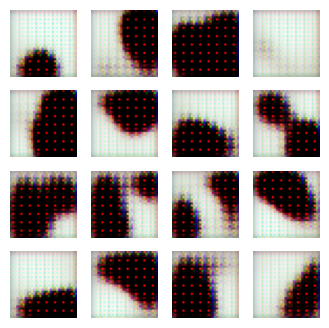

Epoch 1, Time: 31.64s, Gen Loss: 1.8088, Disc Loss: 0.8605


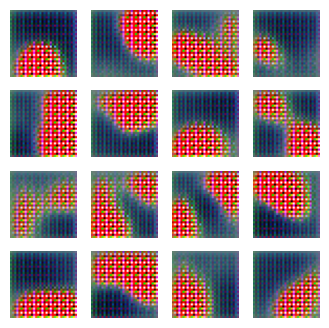

Epoch 2, Time: 22.90s, Gen Loss: 3.5366, Disc Loss: 0.2296


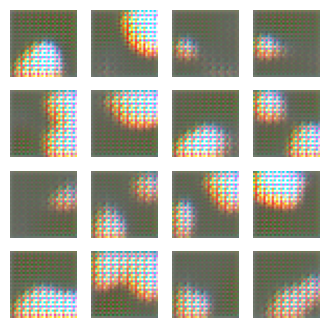

Epoch 3, Time: 22.71s, Gen Loss: 1.3867, Disc Loss: 1.3960


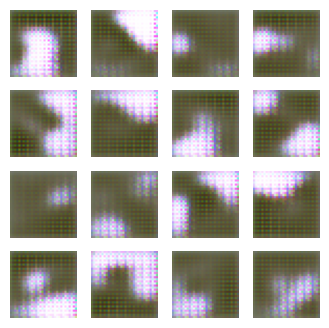

Epoch 4, Time: 22.90s, Gen Loss: 1.3961, Disc Loss: 0.9287


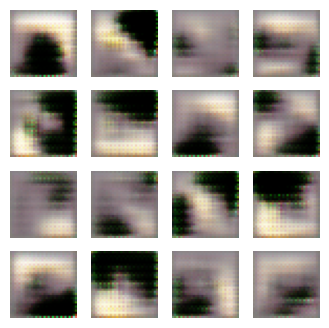

Epoch 5, Time: 23.27s, Gen Loss: 1.4977, Disc Loss: 0.9343


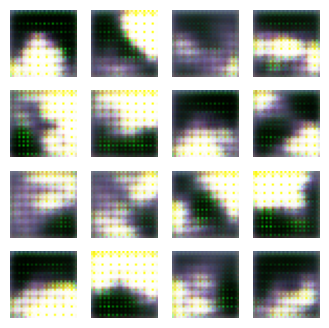

Epoch 6, Time: 22.91s, Gen Loss: 1.6102, Disc Loss: 1.3633


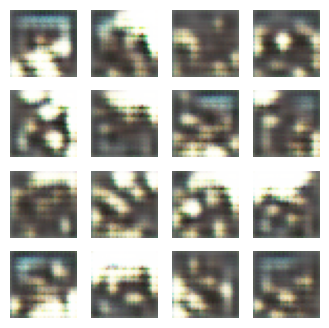

Epoch 7, Time: 22.81s, Gen Loss: 1.2863, Disc Loss: 0.8851


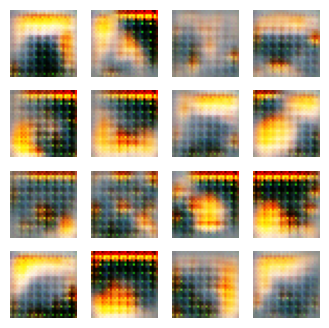

Epoch 8, Time: 23.05s, Gen Loss: 2.0884, Disc Loss: 1.0030


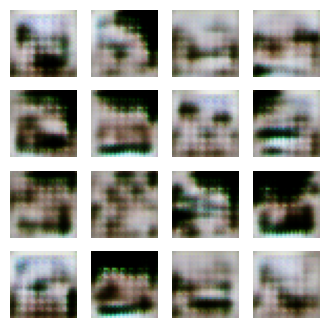

Epoch 9, Time: 23.00s, Gen Loss: 1.4915, Disc Loss: 0.8380


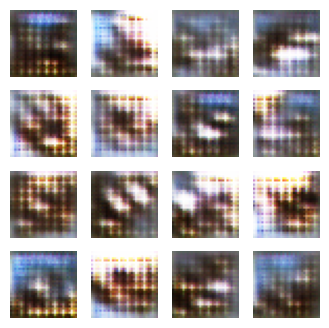

Epoch 10, Time: 23.18s, Gen Loss: 1.1874, Disc Loss: 0.8882


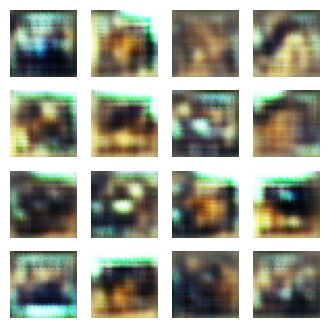

Epoch 11, Time: 22.85s, Gen Loss: 1.0157, Disc Loss: 1.1109


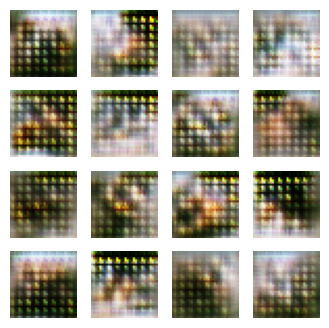

Epoch 12, Time: 23.36s, Gen Loss: 0.7770, Disc Loss: 1.5791


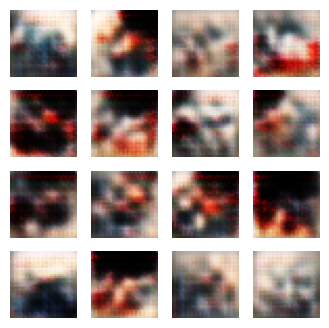

Epoch 13, Time: 22.96s, Gen Loss: 1.3693, Disc Loss: 1.0097


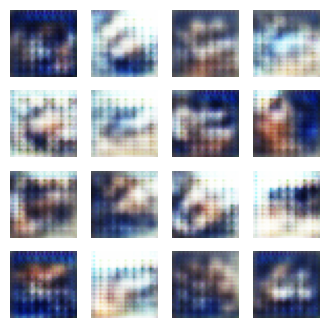

Epoch 14, Time: 23.00s, Gen Loss: 1.4046, Disc Loss: 1.0427


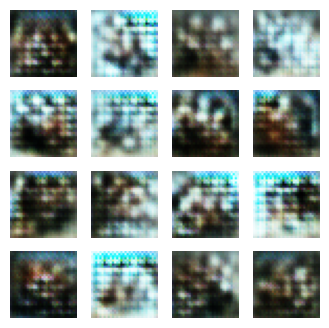

Epoch 15, Time: 23.23s, Gen Loss: 1.2838, Disc Loss: 1.1171


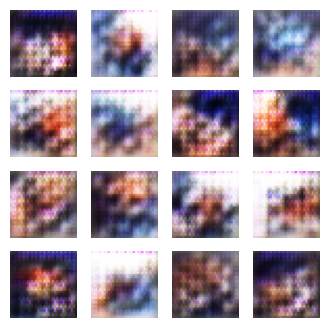

Epoch 16, Time: 22.86s, Gen Loss: 1.0634, Disc Loss: 1.3315


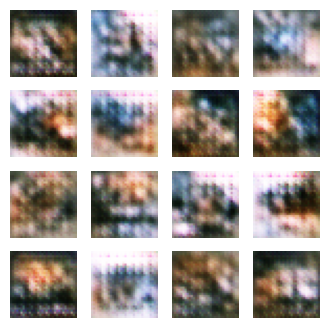

Epoch 17, Time: 22.93s, Gen Loss: 0.6536, Disc Loss: 1.4496


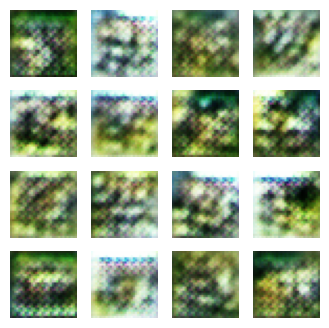

Epoch 18, Time: 23.28s, Gen Loss: 1.0310, Disc Loss: 1.1132


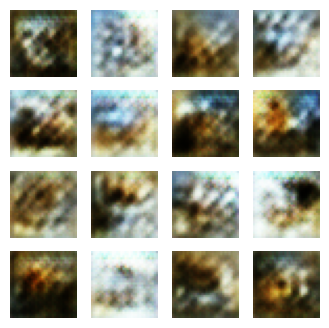

Epoch 19, Time: 22.93s, Gen Loss: 0.8132, Disc Loss: 1.2942


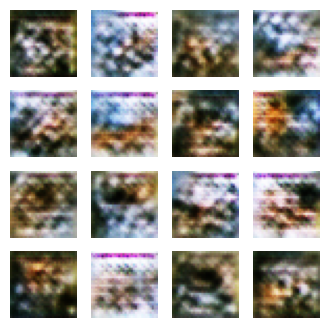

Epoch 20, Time: 23.01s, Gen Loss: 0.7800, Disc Loss: 1.3084


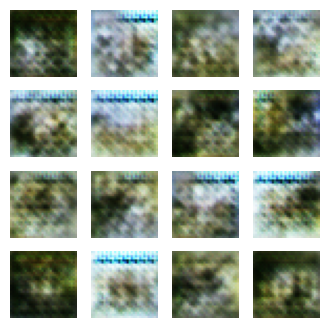

Epoch 21, Time: 22.86s, Gen Loss: 0.9948, Disc Loss: 1.0219


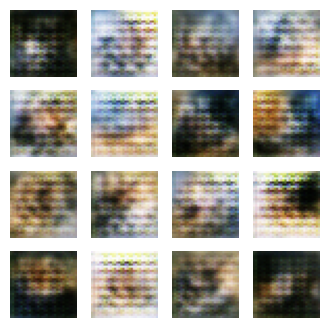

Epoch 22, Time: 23.01s, Gen Loss: 0.9350, Disc Loss: 1.2482


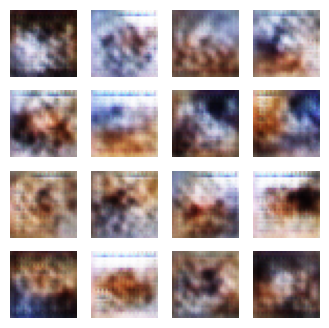

Epoch 23, Time: 23.67s, Gen Loss: 0.8882, Disc Loss: 1.1439


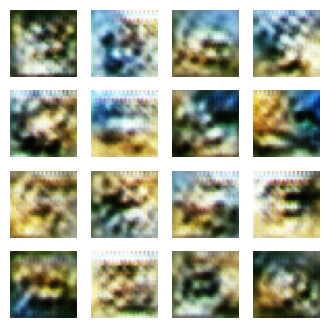

Epoch 24, Time: 22.96s, Gen Loss: 0.7824, Disc Loss: 1.8097


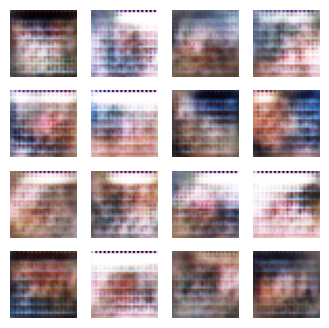

Epoch 25, Time: 22.87s, Gen Loss: 0.8650, Disc Loss: 1.3787


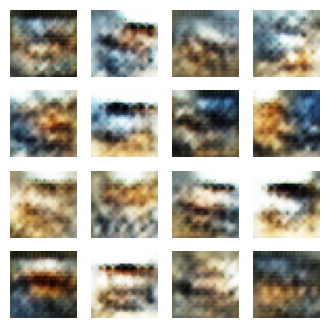

Epoch 26, Time: 22.97s, Gen Loss: 1.1177, Disc Loss: 1.0646


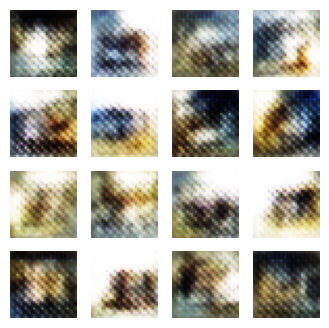

Epoch 27, Time: 22.97s, Gen Loss: 2.0840, Disc Loss: 0.5364


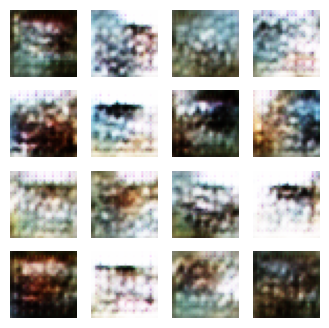

Epoch 28, Time: 22.87s, Gen Loss: 1.0667, Disc Loss: 1.2161


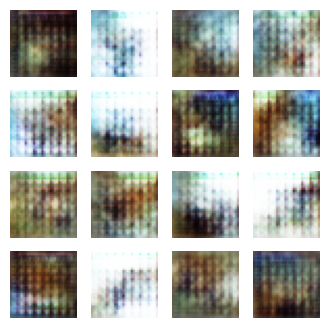

Epoch 29, Time: 22.87s, Gen Loss: 1.2970, Disc Loss: 0.9561


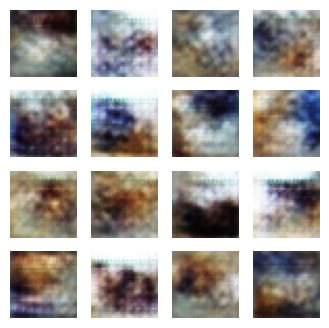

Epoch 30, Time: 23.45s, Gen Loss: 1.0657, Disc Loss: 1.0364


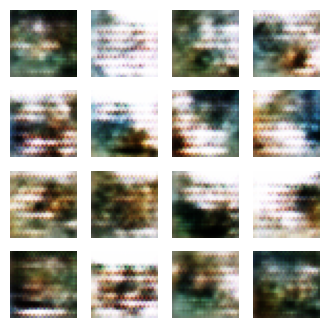

Epoch 31, Time: 23.74s, Gen Loss: 1.4377, Disc Loss: 1.1715


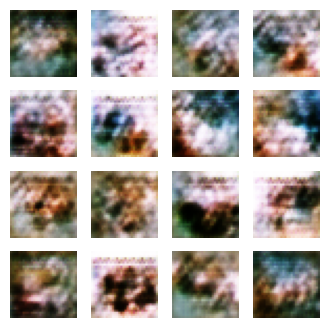

Epoch 32, Time: 23.10s, Gen Loss: 0.9500, Disc Loss: 1.2967


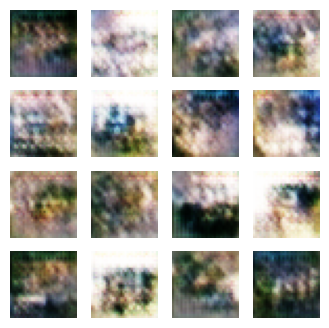

Epoch 33, Time: 23.00s, Gen Loss: 0.8725, Disc Loss: 1.3459


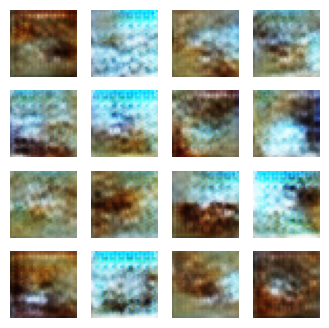

Epoch 34, Time: 23.02s, Gen Loss: 1.3068, Disc Loss: 0.8592


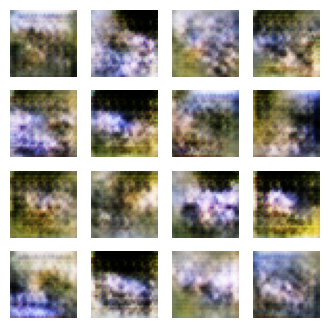

Epoch 35, Time: 23.02s, Gen Loss: 1.4096, Disc Loss: 0.9602


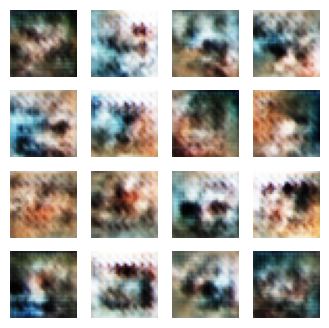

Epoch 36, Time: 23.31s, Gen Loss: 1.0220, Disc Loss: 1.1135


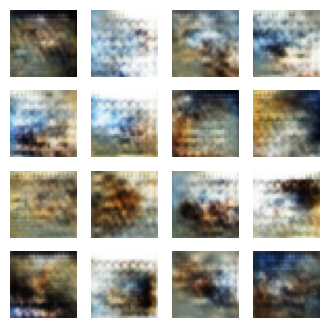

Epoch 37, Time: 22.99s, Gen Loss: 0.9120, Disc Loss: 1.3515


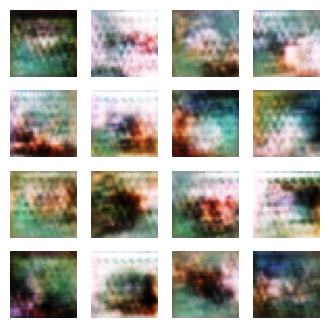

Epoch 38, Time: 23.10s, Gen Loss: 1.0458, Disc Loss: 1.4797


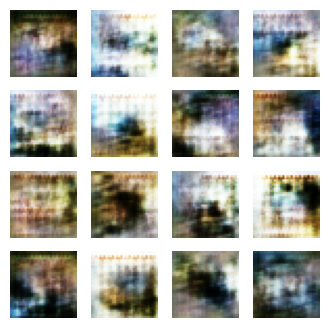

Epoch 39, Time: 23.10s, Gen Loss: 1.2596, Disc Loss: 0.9276


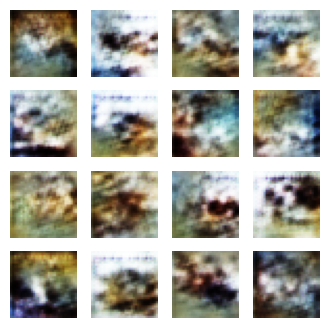

Epoch 40, Time: 23.45s, Gen Loss: 0.9450, Disc Loss: 1.1344


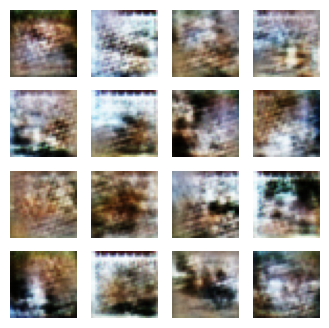

Epoch 41, Time: 23.24s, Gen Loss: 1.0723, Disc Loss: 1.1095


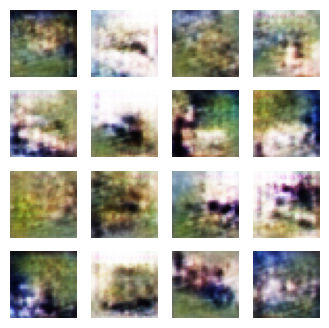

Epoch 42, Time: 23.06s, Gen Loss: 1.0711, Disc Loss: 1.0649


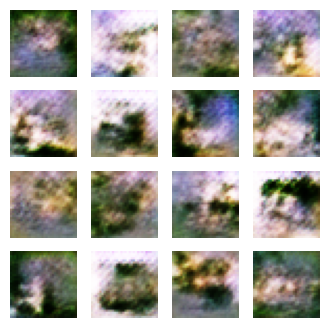

Epoch 43, Time: 23.02s, Gen Loss: 1.0237, Disc Loss: 1.2840


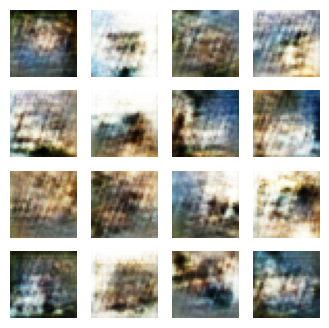

Epoch 44, Time: 22.98s, Gen Loss: 1.0870, Disc Loss: 1.2206


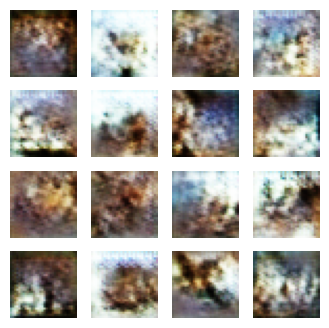

Epoch 45, Time: 23.13s, Gen Loss: 0.7466, Disc Loss: 1.6664


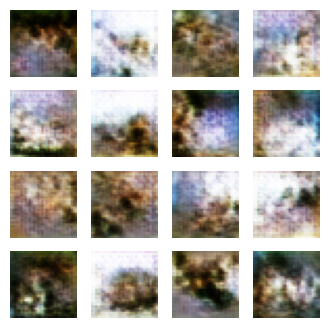

Epoch 46, Time: 23.26s, Gen Loss: 1.1558, Disc Loss: 1.0857


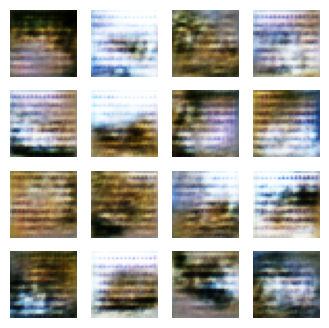

Epoch 47, Time: 23.13s, Gen Loss: 1.7573, Disc Loss: 0.6277


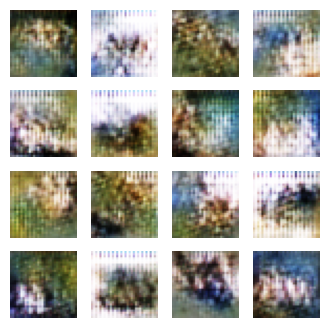

Epoch 48, Time: 23.27s, Gen Loss: 1.5191, Disc Loss: 0.8822


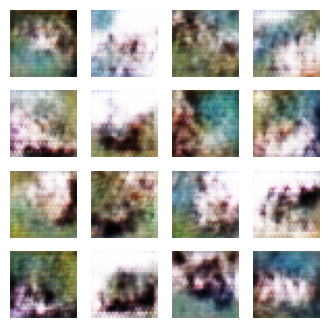

Epoch 49, Time: 22.97s, Gen Loss: 0.9468, Disc Loss: 1.5489


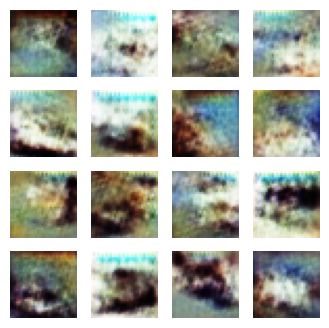

Epoch 50, Time: 23.15s, Gen Loss: 0.9903, Disc Loss: 1.1098


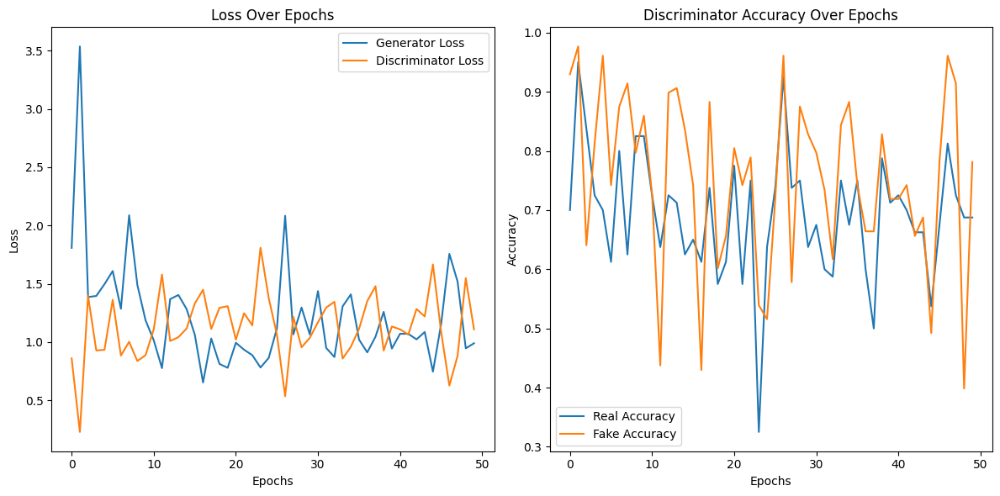

In [12]:
# 학습 실행
train(train_dataset, EPOCHS)

## GAN 모델 학습 결과 분석

### 학습 추이

- **손실 함수:**
    - 생성자 손실: 점차 감소하지만, 20 epoch 이후 불안정해짐 (과적합 가능성)
    - 판별자 손실: 전반적으로 감소하지만, 20 epoch 이후 변동폭 커짐 (판별 어려움)
- **정확도:**
    - Real Accuracy: 비교적 안정적으로 높은 수준 유지
    - Fake Accuracy: 20 epoch 이후 급격하게 감소 (생성 데이터 품질 저하)

### 문제점 및 개선 방향

- **학습 불안정:** Gradient Penalty, Spectral Normalization 적용, Adam Optimizer learning rate 조절
- **과적합 가능성:** Dropout, Regularization 적용, 데이터 증강
- **생성 데이터 품질 저하:** 생성자 구조 개선, 학습 방법 조정

### 추가 고려 사항

- 모델 구조, 학습 데이터, 하이퍼파라미터 최적화 필요

**결론:** 20 epoch 이전까지는 안정적인 학습, 이후 학습 불안정, 과적합 가능성, 생성 데이터 품질 저하 문제 발생. 다양한 개선 방법을 시도하여 GAN 모델 성능 향상 필요.



# **STEP 8: GAN 훈련 과정 개선하기**

**적용한 개선 사항**<br><br>
생성자 구조 개선:

Dropout 레이어 추가로 과적합 방지.

Conv2DTranspose 필터 수 증가로 더 세밀한 이미지 생성.
<br><br>
판별자 구조 개선:

BatchNormalization 추가로 학습 안정성 확보.

컨볼루션 레이어 확장으로 더 깊은 네트워크 구성.
<br><br>
학습 과정 개선:

Exponential Decay 스케줄러를 사용해 학습률을 동적으로 조정.

손실 함수 가중치 조정으로 생성자와 판별자의 균형 유지.
<br><br>
복잡한 기법을 배제한 이유

Gradient Penalty와 Spectral Normalization: 기존 손실 함수 및 모델 구조를 대폭 수정해야 하며, 계산 비용 증가.

데이터 증강: GAN의 목적과 다소 상충되며, Dropout과 Regularization으로 대체 가능.

세부 단계 1: 새로운 디렉토리 및 변수명 설정

In [39]:
# 새로운 디렉토리 생성
new_base_dir = '/content/dcgan_improved'
os.makedirs(f'{new_base_dir}/generated_samples', exist_ok=True)
os.makedirs(f'{new_base_dir}/training_checkpoints', exist_ok=True)
os.makedirs(f'{new_base_dir}/training_history', exist_ok=True)

# 새로운 체크포인트 경로 설정
new_checkpoint_dir = f'{new_base_dir}/training_checkpoints'
new_checkpoint_prefix = os.path.join(new_checkpoint_dir, "ckpt")

# 새로운 변수명으로 모델과 옵티마이저 정의
improved_generator = build_generator()  # 기존 생성자 함수 재사용
improved_discriminator = build_discriminator()  # 기존 판별자 함수 재사용

improved_generator_optimizer = tf.keras.optimizers.Adam(1e-4)
improved_discriminator_optimizer = tf.keras.optimizers.Adam(1e-4)

# 새로운 체크포인트 객체 생성
improved_checkpoint = tf.train.Checkpoint(generator=improved_generator,
                                          discriminator=improved_discriminator,
                                          generator_optimizer=improved_generator_optimizer,
                                          discriminator_optimizer=improved_discriminator_optimizer)

print("새로운 디렉토리와 변수명이 설정되었습니다.")


새로운 디렉토리와 변수명이 설정되었습니다.


세부 2단계: 추가적인 GAN 모델 구조 변경

In [40]:
# 수정된 생성자 모델 정의 함수
def build_generator_v2():
    model = tf.keras.Sequential([
        layers.Dense(8 * 8 * 512, use_bias=False, input_shape=(100,)),
        layers.BatchNormalization(),
        layers.LeakyReLU(),
        layers.Reshape((8, 8, 512)),

        # 첫 번째 업샘플링 (8x8x512 -> 16x16x256)
        layers.Conv2DTranspose(256, (5, 5), strides=(2, 2), padding='same', use_bias=False),
        layers.BatchNormalization(),
        layers.LeakyReLU(),

        # 두 번째 업샘플링 (16x16x256 -> 32x32x128)
        layers.Conv2DTranspose(128, (5, 5), strides=(2, 2), padding='same', use_bias=False),
        layers.BatchNormalization(),
        layers.LeakyReLU(),

        # Dropout 추가
        layers.Dropout(0.3),

        # 출력 레이어 (32x32x128 -> 32x32x3)
        layers.Conv2DTranspose(3, (5, 5), strides=(1, 1), padding='same', activation='tanh')
    ])
    return model

# 수정된 판별자 모델 정의 함수
def build_discriminator_v2():
    model = tf.keras.Sequential([
        # 입력: 32x32x3 이미지
        layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same', input_shape=(32, 32, 3)),
        layers.LeakyReLU(),
        layers.Dropout(0.3),

        # 두 번째 컨볼루션 레이어
        layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same'),
        layers.BatchNormalization(),
        layers.LeakyReLU(),
        layers.Dropout(0.3),

        # 세 번째 컨볼루션 레이어 추가
        layers.Conv2D(256, (5, 5), strides=(2, 2), padding='same'),
        layers.BatchNormalization(),
        layers.LeakyReLU(),

        # 출력 레이어
        layers.Flatten(),
        layers.Dense(1)
    ])
    return model

# 새로운 생성자와 판별자 모델 생성
improved_generator = build_generator_v2()
improved_discriminator = build_discriminator_v2()

# 생성자와 판별자의 출력 테스트
noise = tf.random.normal([1, 100])
generated_image_v2 = improved_generator(noise)
decision_v2 = improved_discriminator(generated_image_v2)

print("Modified Generator Output Shape:", generated_image_v2.shape)
print("Modified Discriminator Decision:", decision_v2.numpy())


Modified Generator Output Shape: (1, 32, 32, 3)
Modified Discriminator Decision: [[0.00127632]]


세부 3단계: 학습 과정 개선

In [41]:
# 학습률 스케줄러 정의
lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=1e-4,
    decay_steps=10000,
    decay_rate=0.96,
    staircase=True
)

# 옵티마이저에 스케줄러 적용
improved_generator_optimizer = tf.keras.optimizers.Adam(learning_rate=lr_schedule)
improved_discriminator_optimizer = tf.keras.optimizers.Adam(learning_rate=lr_schedule)

# 손실 가중치 조정
def weighted_discriminator_loss(real_output, fake_output, weight=0.5):
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    total_loss = weight * real_loss + (1 - weight) * fake_loss
    return total_loss

def weighted_generator_loss(fake_output, weight=0.5):
    return weight * cross_entropy(tf.ones_like(fake_output), fake_output)

# 개선된 train_step 함수
@tf.function
def improved_train_step(images):
    noise = tf.random.normal([BATCH_SIZE, 100])

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        generated_images = improved_generator(noise, training=True)

        real_output = improved_discriminator(images, training=True)
        fake_output = improved_discriminator(generated_images, training=True)

        gen_loss = weighted_generator_loss(fake_output, weight=0.7)
        disc_loss = weighted_discriminator_loss(real_output, fake_output, weight=0.7)

    gradients_of_generator = gen_tape.gradient(gen_loss, improved_generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, improved_discriminator.trainable_variables)

    improved_generator_optimizer.apply_gradients(zip(gradients_of_generator, improved_generator.trainable_variables))
    improved_discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, improved_discriminator.trainable_variables))

    real_accuracy, fake_accuracy = discriminator_accuracy(real_output, fake_output)

    return gen_loss, disc_loss, real_accuracy, fake_accuracy

print("학습 과정 개선 완료.")


학습 과정 개선 완료.


세부 4단계: 개선된 모델 학습 및 결과 비교

In [44]:
# 학습에 필요한 설정
IMPROVED_EPOCHS = 50
num_examples_to_generate = 16

# 고정된 seed 생성 (훈련 과정 동안 일관된 입력으로 사용)
improved_seed = tf.random.normal([num_examples_to_generate, 100])

# 개선된 학습 히스토리 초기화
improved_history = {
    'gen_loss': [],
    'disc_loss': [],
    'real_acc': [],
    'fake_acc': []
}

# 개선된 학습 루프 구현
def improved_train(dataset, epochs):
    for epoch in range(epochs):
        start = time.time()

        # 배치 단위로 훈련 진행
        for image_batch in dataset:
            gen_loss, disc_loss, real_acc, fake_acc = improved_train_step(image_batch)

        # 손실 및 정확도 기록
        improved_history['gen_loss'].append(gen_loss.numpy())
        improved_history['disc_loss'].append(disc_loss.numpy())
        improved_history['real_acc'].append(real_acc.numpy())
        improved_history['fake_acc'].append(fake_acc.numpy())

        # 샘플 이미지 생성 및 저장
        generate_and_save_images(improved_generator, epoch + 1, improved_seed)

        # 체크포인트 저장 (10 epoch마다)
        if (epoch + 1) % 10 == 0:
            improved_checkpoint.save(file_prefix=new_checkpoint_prefix)

        print(f'Epoch {epoch + 1}, Time: {time.time() - start:.2f}s, Gen Loss: {gen_loss:.4f}, Disc Loss: {disc_loss:.4f}')

    # 학습 히스토리 시각화
    draw_train_history(improved_history)



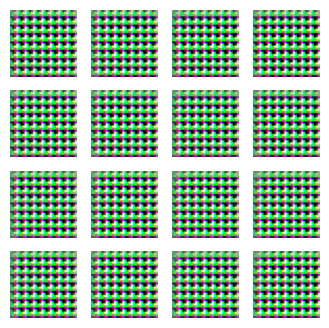

Epoch 1, Time: 46.82s, Gen Loss: 3.0887, Disc Loss: 0.0118


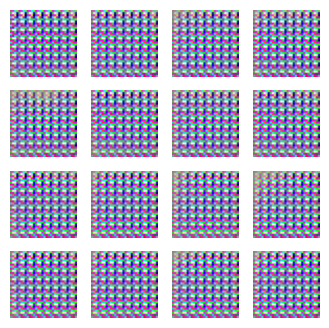

Epoch 2, Time: 37.53s, Gen Loss: 9.5780, Disc Loss: 0.0039


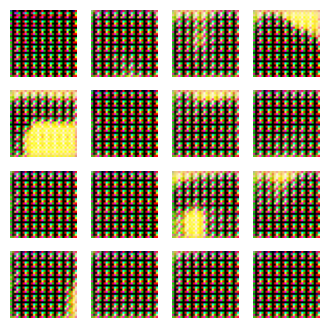

Epoch 3, Time: 37.38s, Gen Loss: 3.1778, Disc Loss: 0.0185


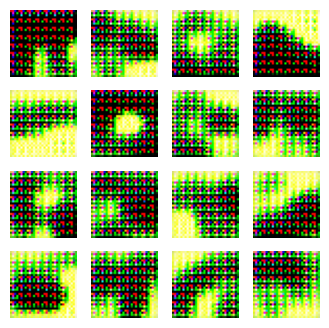

Epoch 4, Time: 37.43s, Gen Loss: 2.8079, Disc Loss: 0.0318


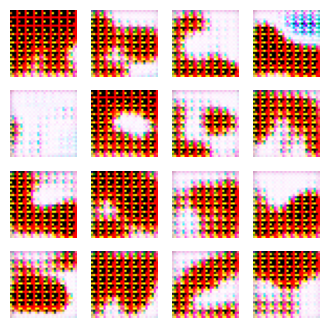

Epoch 5, Time: 37.16s, Gen Loss: 4.5697, Disc Loss: 0.0057


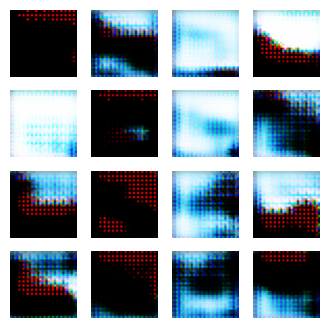

Epoch 6, Time: 37.94s, Gen Loss: 4.2259, Disc Loss: 0.0060


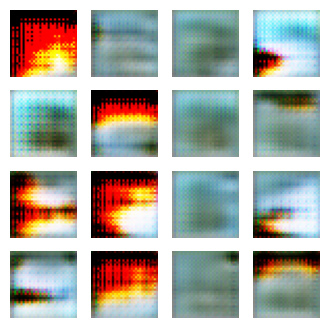

Epoch 7, Time: 37.14s, Gen Loss: 2.2539, Disc Loss: 0.0952


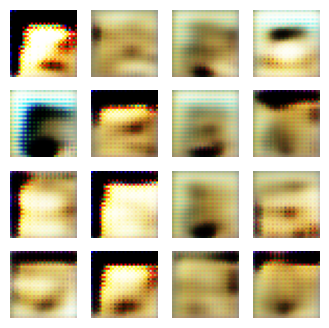

Epoch 8, Time: 37.20s, Gen Loss: 2.5159, Disc Loss: 0.0474


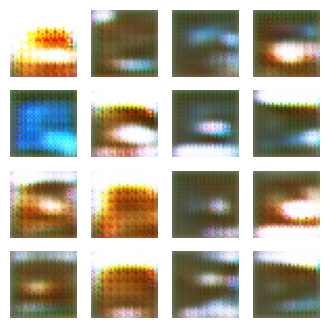

Epoch 9, Time: 37.16s, Gen Loss: 2.4920, Disc Loss: 0.0888


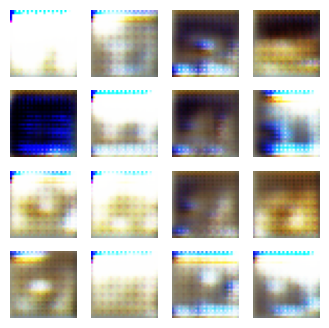

Epoch 10, Time: 37.27s, Gen Loss: 3.2444, Disc Loss: 0.0237


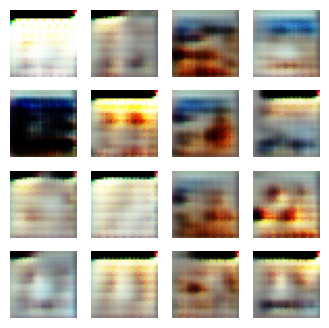

Epoch 11, Time: 38.13s, Gen Loss: 2.2585, Disc Loss: 0.0717


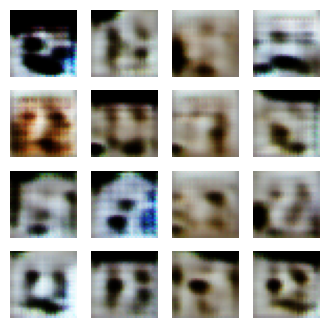

Epoch 12, Time: 37.45s, Gen Loss: 2.6144, Disc Loss: 0.0355


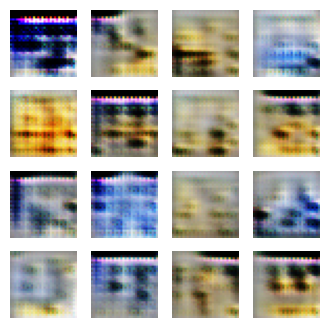

Epoch 13, Time: 37.25s, Gen Loss: 3.3257, Disc Loss: 0.0187


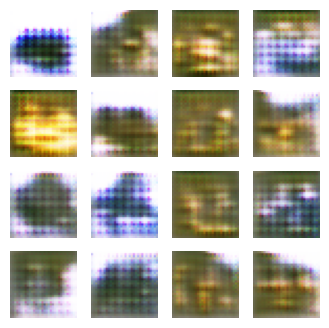

Epoch 14, Time: 36.95s, Gen Loss: 3.8674, Disc Loss: 0.0091


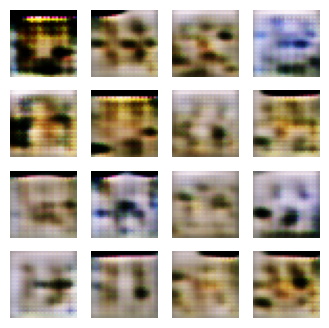

Epoch 15, Time: 37.01s, Gen Loss: 2.5595, Disc Loss: 0.0177


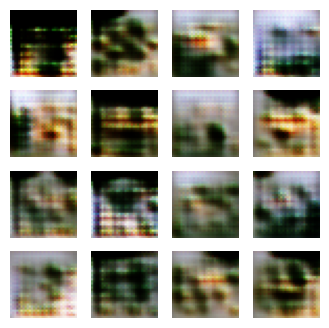

Epoch 16, Time: 37.15s, Gen Loss: 2.8613, Disc Loss: 0.0922


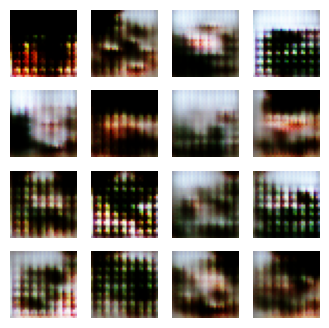

Epoch 17, Time: 37.25s, Gen Loss: 2.6853, Disc Loss: 0.0204


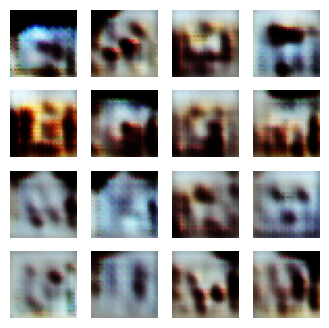

Epoch 18, Time: 37.14s, Gen Loss: 1.3608, Disc Loss: 0.1846


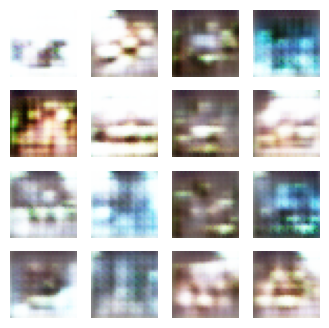

Epoch 19, Time: 37.16s, Gen Loss: 1.1297, Disc Loss: 0.1708


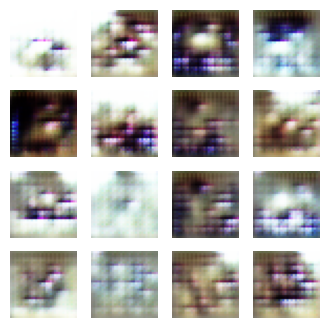

Epoch 20, Time: 37.64s, Gen Loss: 1.3227, Disc Loss: 0.2942


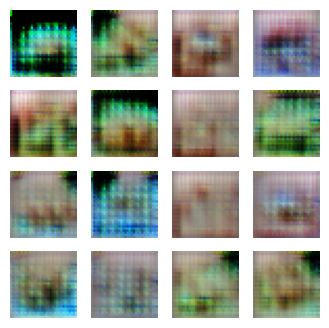

Epoch 21, Time: 36.89s, Gen Loss: 1.9086, Disc Loss: 0.0501


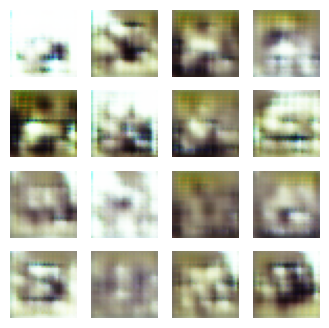

Epoch 22, Time: 37.31s, Gen Loss: 2.4889, Disc Loss: 0.1227


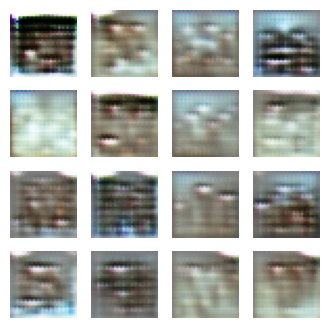

Epoch 23, Time: 37.09s, Gen Loss: 0.6636, Disc Loss: 0.3176


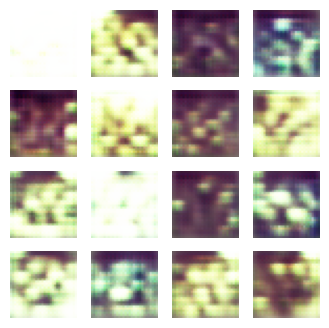

Epoch 24, Time: 36.93s, Gen Loss: 1.6172, Disc Loss: 0.0887


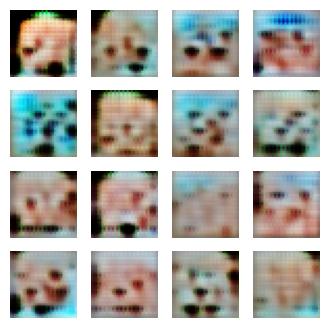

Epoch 25, Time: 37.21s, Gen Loss: 1.2603, Disc Loss: 0.1247


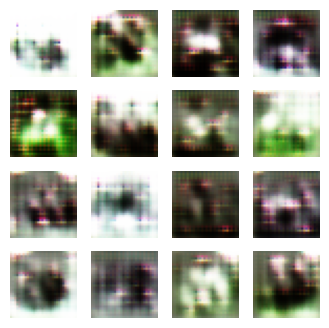

Epoch 26, Time: 37.15s, Gen Loss: 1.1279, Disc Loss: 0.2341


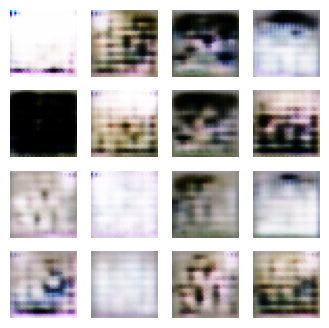

Epoch 27, Time: 37.47s, Gen Loss: 2.1253, Disc Loss: 0.1020


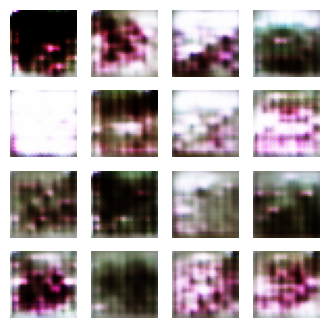

Epoch 28, Time: 38.36s, Gen Loss: 2.6479, Disc Loss: 0.0992


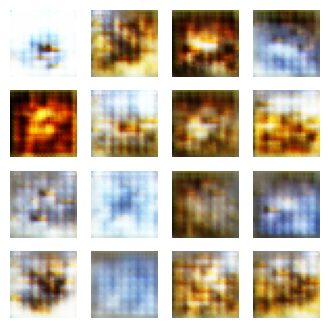

Epoch 29, Time: 38.83s, Gen Loss: 0.9872, Disc Loss: 0.2086


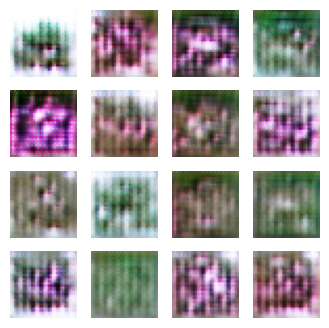

Epoch 30, Time: 38.86s, Gen Loss: 1.3896, Disc Loss: 0.6244


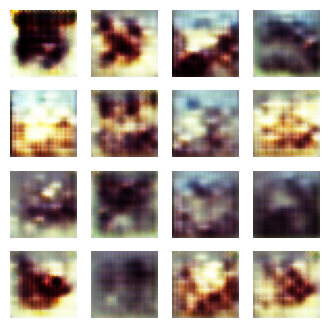

Epoch 31, Time: 38.82s, Gen Loss: 0.7382, Disc Loss: 0.4851


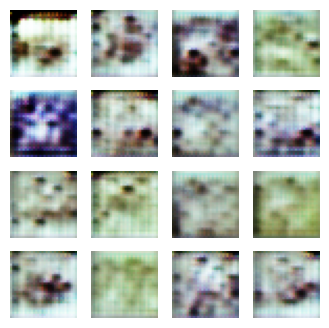

Epoch 32, Time: 37.47s, Gen Loss: 1.3224, Disc Loss: 0.1252


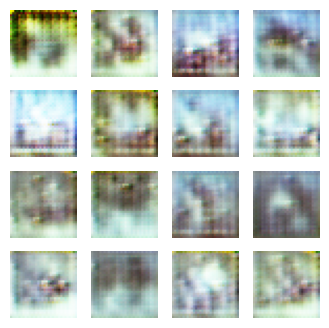

Epoch 33, Time: 36.91s, Gen Loss: 0.8131, Disc Loss: 0.3339


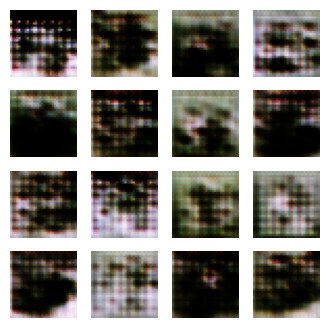

Epoch 34, Time: 36.94s, Gen Loss: 1.2146, Disc Loss: 0.3642


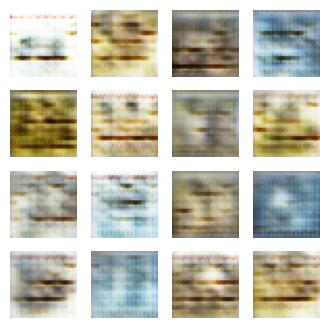

Epoch 35, Time: 36.96s, Gen Loss: 0.9719, Disc Loss: 0.2726


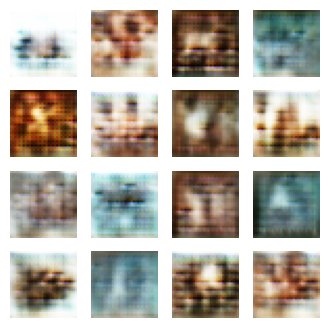

Epoch 36, Time: 37.05s, Gen Loss: 0.6704, Disc Loss: 0.4657


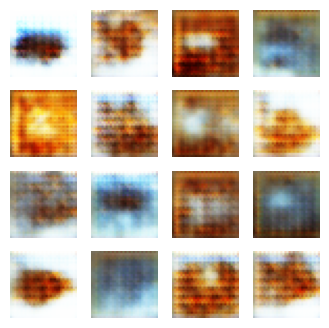

Epoch 37, Time: 37.46s, Gen Loss: 1.8908, Disc Loss: 0.0697


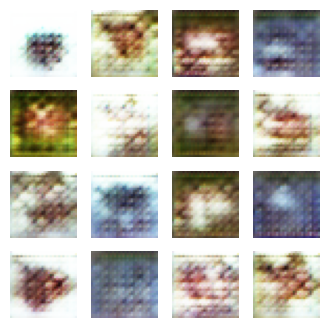

Epoch 38, Time: 37.04s, Gen Loss: 1.0807, Disc Loss: 0.4518


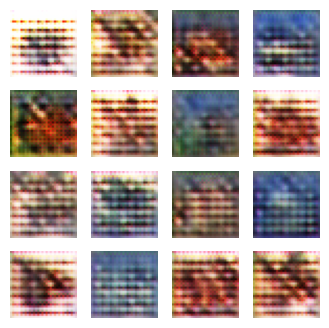

Epoch 39, Time: 37.03s, Gen Loss: 1.6565, Disc Loss: 0.0596


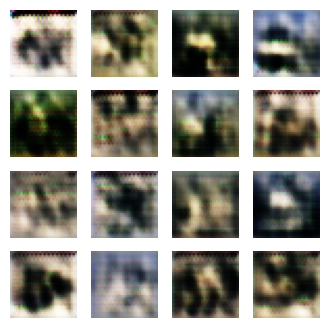

Epoch 40, Time: 37.34s, Gen Loss: 1.0561, Disc Loss: 0.1941


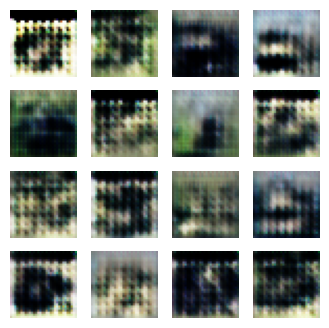

Epoch 41, Time: 36.96s, Gen Loss: 1.6112, Disc Loss: 0.1190


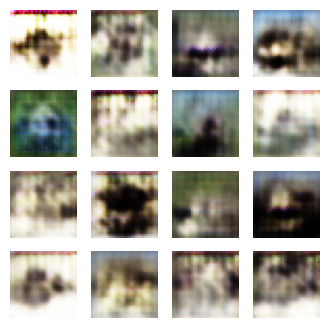

Epoch 42, Time: 37.01s, Gen Loss: 0.7007, Disc Loss: 0.5510


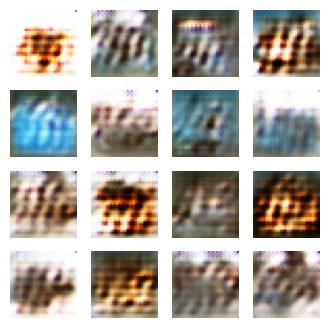

Epoch 43, Time: 36.96s, Gen Loss: 1.4314, Disc Loss: 0.0740


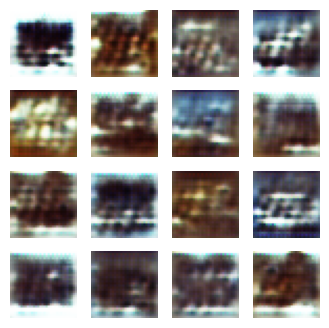

Epoch 44, Time: 37.45s, Gen Loss: 1.7549, Disc Loss: 0.1703


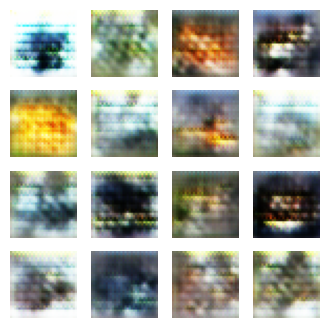

Epoch 45, Time: 37.11s, Gen Loss: 0.4687, Disc Loss: 0.3519


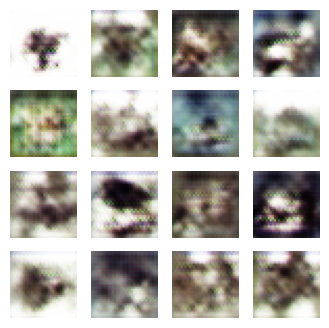

Epoch 46, Time: 37.49s, Gen Loss: 0.8568, Disc Loss: 0.3003


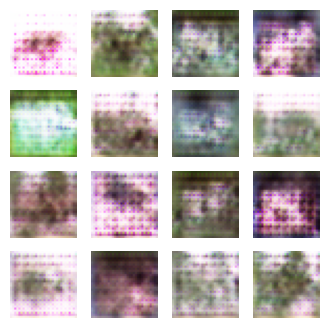

Epoch 47, Time: 37.15s, Gen Loss: 0.3789, Disc Loss: 0.4350


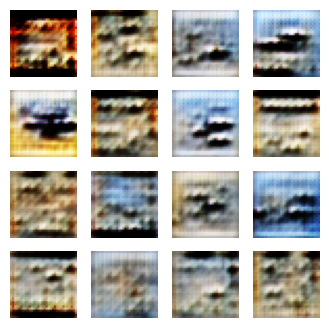

Epoch 48, Time: 37.82s, Gen Loss: 1.9970, Disc Loss: 0.0490


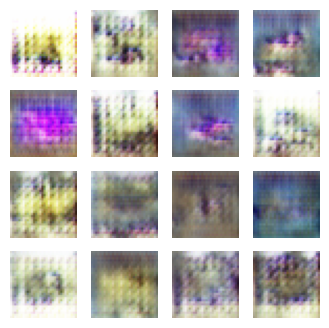

Epoch 49, Time: 37.91s, Gen Loss: 0.6613, Disc Loss: 0.3956


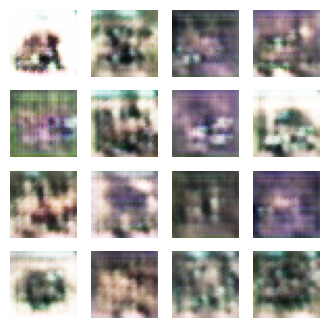

Epoch 50, Time: 38.13s, Gen Loss: 1.9499, Disc Loss: 0.2062


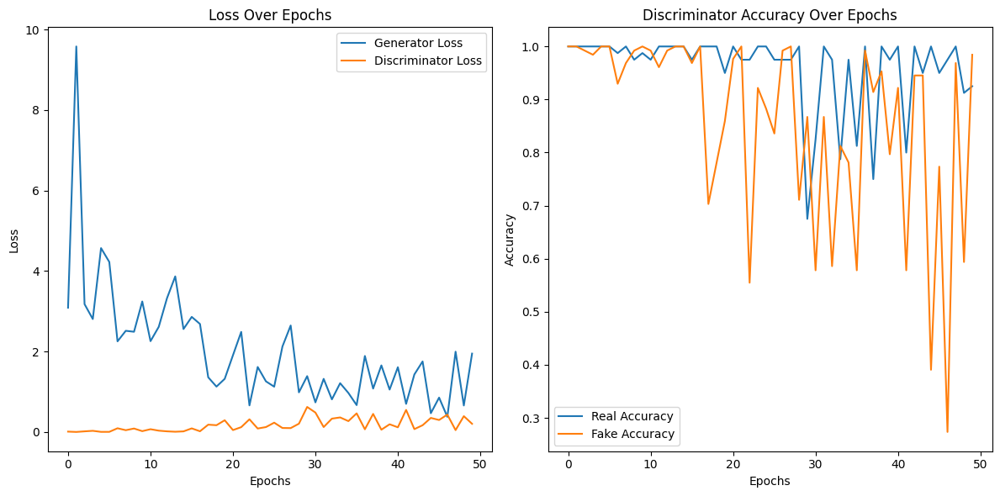

In [45]:
# 개선된 모델 학습 실행
improved_train(train_dataset, IMPROVED_EPOCHS)


세부 5단계: 결과 시각화 및 성능 분석

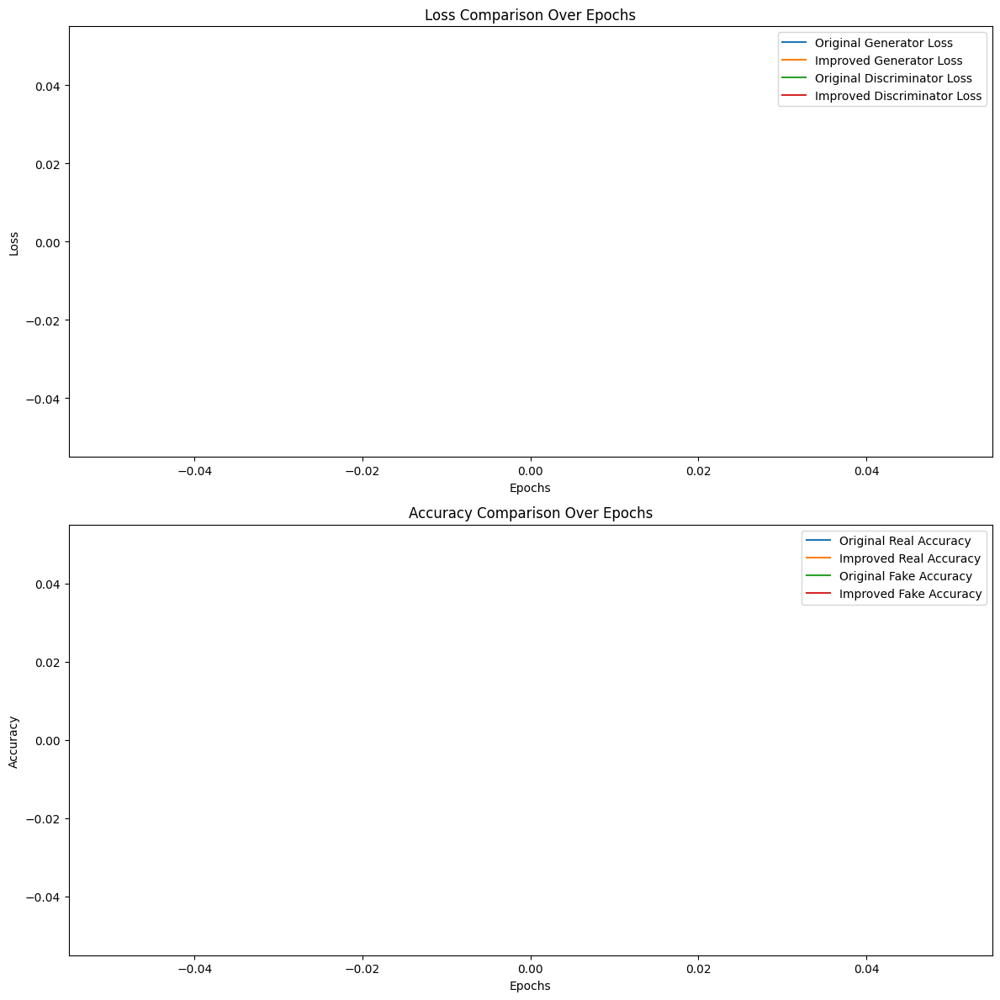

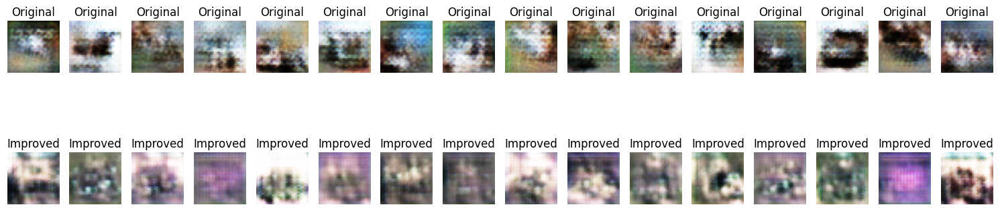

In [54]:
# 기존 모델과 개선된 모델의 학습 히스토리를 비교하기 위한 함수
def compare_train_history(original_history, improved_history):
    # 두 히스토리의 최소 길이로 동기화
    min_epochs = min(len(original_history['gen_loss']), len(improved_history['gen_loss']))

    # 동기화된 데이터 준비
    epochs = range(min_epochs)
    original_gen_loss = original_history['gen_loss'][:min_epochs]
    improved_gen_loss = improved_history['gen_loss'][:min_epochs]
    original_disc_loss = original_history['disc_loss'][:min_epochs]
    improved_disc_loss = improved_history['disc_loss'][:min_epochs]
    original_real_acc = original_history['real_acc'][:min_epochs]
    improved_real_acc = improved_history['real_acc'][:min_epochs]
    original_fake_acc = original_history['fake_acc'][:min_epochs]
    improved_fake_acc = improved_history['fake_acc'][:min_epochs]

    plt.figure(figsize=(12, 12))

    # Loss 비교
    plt.subplot(2, 1, 1)
    plt.plot(epochs, original_gen_loss, label='Original Generator Loss')
    plt.plot(epochs, improved_gen_loss, label='Improved Generator Loss')
    plt.plot(epochs, original_disc_loss, label='Original Discriminator Loss')
    plt.plot(epochs, improved_disc_loss, label='Improved Discriminator Loss')
    plt.title('Loss Comparison Over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    # Accuracy 비교
    plt.subplot(2, 1, 2)
    plt.plot(epochs, original_real_acc, label='Original Real Accuracy')
    plt.plot(epochs, improved_real_acc, label='Improved Real Accuracy')
    plt.plot(epochs, original_fake_acc, label='Original Fake Accuracy')
    plt.plot(epochs, improved_fake_acc, label='Improved Fake Accuracy')
    plt.title('Accuracy Comparison Over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    plt.tight_layout()
    plt.show()


# 기존 모델과 개선된 모델의 히스토리 비교
compare_train_history(history, improved_history)

# 동일한 seed로 생성된 이미지 비교
def compare_generated_images(original_generator, improved_generator, seed):
    # 기존 모델로 생성된 이미지
    original_images = original_generator(seed, training=False)

    # 개선된 모델로 생성된 이미지
    improved_images = improved_generator(seed, training=False)

    # 시각화
    fig, axes = plt.subplots(2, len(seed), figsize=(15, 5))

    for i in range(len(seed)):
        # 기존 모델 이미지
        axes[0][i].imshow((original_images[i] + 1) / 2)
        axes[0][i].axis('off')
        axes[0][i].set_title("Original")

        # 개선된 모델 이미지
        axes[1][i].imshow((improved_images[i] + 1) / 2)
        axes[1][i].axis('off')
        axes[1][i].set_title("Improved")

    plt.tight_layout()
    plt.show()

# 생성된 이미지 비교 실행
compare_generated_images(generator, improved_generator, seed)


In [59]:
# STEP 1: 작업환경 구성하기
!pip install imageio Pillow tensorflow

import os
import numpy as np
import tensorflow as tf
from tensorflow.keras import layers
import matplotlib.pyplot as plt
import time

# 새로운 저장 경로 생성
os.makedirs('/content/dcgan_model2/generated_samples', exist_ok=True)
os.makedirs('/content/dcgan_model2/training_checkpoints', exist_ok=True)

print("TensorFlow version:", tf.__version__)

# STEP 2: 데이터셋 구성 및 전처리
cifar10 = tf.keras.datasets.cifar10
(train_x, _), (_, _) = cifar10.load_data()
train_x = (train_x / 127.5) - 1  # 픽셀 값 정규화 (-1 ~ 1 범위)
train_x = train_x.astype('float32')

BUFFER_SIZE = 60000
BATCH_SIZE = 128

train_dataset = tf.data.Dataset.from_tensor_slices(train_x).shuffle(BUFFER_SIZE).batch(BATCH_SIZE)

# STEP 3: 생성자 모델 구현하기
def build_generator():
    model = tf.keras.Sequential([
        layers.Dense(8 * 8 * 256, use_bias=False, input_shape=(100,)),
        layers.BatchNormalization(),
        layers.LeakyReLU(),
        layers.Reshape((8, 8, 256)),
        layers.Conv2DTranspose(128, (5, 5), strides=(2, 2), padding='same', use_bias=False),
        layers.BatchNormalization(),
        layers.LeakyReLU(),
        layers.Conv2DTranspose(64, (5, 5), strides=(2, 2), padding='same', use_bias=False),
        layers.BatchNormalization(),
        layers.LeakyReLU(),
        layers.Conv2DTranspose(3, (5, 5), strides=(1, 1), padding='same', activation='tanh')
    ])
    return model

generator_model2 = build_generator()

# STEP 4: 판별자 모델 구현하기
def build_discriminator():
    model = tf.keras.Sequential([
        layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same', input_shape=(32, 32, 3)),
        layers.LeakyReLU(),
        layers.Dropout(0.3),
        layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same'),
        layers.LeakyReLU(),
        layers.Dropout(0.3),
        layers.Flatten(),
        layers.Dense(1)
    ])
    return model

discriminator_model2 = build_discriminator()

# STEP 5: 손실 함수 및 최적화 함수 구현하기
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    return real_loss + fake_loss

def discriminator_accuracy(real_output, fake_output):
    real_accuracy = tf.reduce_mean(tf.cast(tf.equal(tf.ones_like(real_output), tf.round(tf.sigmoid(real_output))), tf.float32))
    fake_accuracy = tf.reduce_mean(tf.cast(tf.equal(tf.zeros_like(fake_output), tf.round(tf.sigmoid(fake_output))), tf.float32))
    return real_accuracy.numpy(), fake_accuracy.numpy()

generator_optimizer_model2 = tf.keras.optimizers.Adam(1e-4)
discriminator_optimizer_model2 = tf.keras.optimizers.Adam(4e-4)

# STEP 6: 훈련 과정 상세 기능 구현하기
@tf.function
def train_step_model2(images):
    noise = tf.random.normal([BATCH_SIZE, 100])

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        generated_images = generator_model2(noise, training=True)

        real_output = discriminator_model2(images, training=True)
        fake_output = discriminator_model2(generated_images, training=True)

        gen_loss = generator_loss(fake_output)
        disc_loss = discriminator_loss(real_output, fake_output)

    gradients_of_generator = gen_tape.gradient(gen_loss, generator_model2.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator_model2.trainable_variables)

    generator_optimizer_model2.apply_gradients(zip(gradients_of_generator, generator_model2.trainable_variables))
    discriminator_optimizer_model2.apply_gradients(zip(gradients_of_discriminator, discriminator_model2.trainable_variables))

    real_accuracy, fake_accuracy = discriminator_accuracy(real_output, fake_output)

    return gen_loss.numpy(), disc_loss.numpy(), real_accuracy, fake_accuracy

def generate_and_save_images(model, epoch, test_input):
    predictions = model(test_input, training=False)
    plt.figure(figsize=(4, 4))
    for i in range(predictions.shape[0]):
        plt.subplot(4, 4, i + 1)
        plt.imshow((predictions[i] + 1) / 2)
        plt.axis('off')
    plt.savefig(f'/content/dcgan_model2/generated_samples/image_at_epoch_{epoch:04d}.png')
    plt.show()

def draw_train_history(history):
    epochs = range(len(history['gen_loss']))
    plt.figure(figsize=(12, 6))

    plt.subplot(1, 2, 1)
    plt.plot(epochs, history['gen_loss'], label='Generator Loss')
    plt.plot(epochs, history['disc_loss'], label='Discriminator Loss')
    plt.title('Loss Over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(epochs, history['real_acc'], label='Real Accuracy')
    plt.plot(epochs['fake_acc'], label='Fake Accuracy')
    plt.title('Discriminator Accuracy Over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

# STEP 7: 학습 루프 구현 및 실행
EPOCHS_MODEL_2 = 50
num_examples_to_generate_model_2 = 16

# 고정된 seed 생성 (훈련 과정 동안 일관된 입력으로 사용)
seed_model_2 = tf.random.normal([num_examples_to_generate_model_2, 100])

# 학습 히스토리 초기화
history_model_2 = {
    'gen_loss': [],
    'disc_loss': [],
    'real_acc': [],
    'fake_acc': []
}

def train_model_2(dataset, epochs):
    for epoch in range(epochs):
        start = time.time()

        # 배치 단위로 훈련 진행
        for image_batch in dataset:
            gen_loss, disc_loss, real_acc, fake_acc = train_step_model2(image_batch)

        # 손실 및 정확도 기록
        history_model_2['gen_loss'].append(gen_loss)
        history_model_2['disc_loss'].append(disc_loss)
        history_model_2['real_acc'].append(real_acc)
        history_model_2['fake_acc'].append(fake_acc)

        # 샘플 이미지 생성 및 저장
        generate_and_save_images(generator_model2, epoch + 1, seed_model_2)

        # 에포크별 진행 상황 출력
        print(f'Epoch {epoch + 1}, Time: {time.time() - start:.2f}s')
        print(f'Generator Loss: {gen_loss:.4f}, Discriminator Loss: {disc_loss:.4f}')
        print(f'Real Accuracy: {real_acc:.4f}, Fake Accuracy: {fake_acc:.4f}')

    # 학습 히스토리 시각화
    draw_train_history(history_model_2)



TensorFlow version: 2.18.0


In [61]:
def train_step_model2(images):
    noise = tf.random.normal([BATCH_SIZE, 100])

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        generated_images = generator_model2(noise, training=True)

        real_output = discriminator_model2(images, training=True)
        fake_output = discriminator_model2(generated_images, training=True)

        gen_loss = generator_loss(fake_output)
        disc_loss = discriminator_loss(real_output, fake_output)

    gradients_of_generator = gen_tape.gradient(gen_loss, generator_model2.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator_model2.trainable_variables)

    generator_optimizer_model2.apply_gradients(zip(gradients_of_generator, generator_model2.trainable_variables))
    discriminator_optimizer_model2.apply_gradients(zip(gradients_of_discriminator, discriminator_model2.trainable_variables))

    # 정확도 계산
    real_accuracy = tf.reduce_mean(tf.cast(tf.equal(tf.ones_like(real_output), tf.round(tf.sigmoid(real_output))), tf.float32))
    fake_accuracy = tf.reduce_mean(tf.cast(tf.equal(tf.zeros_like(fake_output), tf.round(tf.sigmoid(fake_output))), tf.float32))

    return gen_loss.numpy(), disc_loss.numpy(), real_accuracy.numpy(), fake_accuracy.numpy()

In [62]:
# 학습 실행
train_model_2(train_dataset, EPOCHS_MODEL_2)


InvalidArgumentError: {{function_node __wrapped__Sub_device_/job:localhost/replica:0/task:0/device:GPU:0}} required broadcastable shapes [Op:Sub]